In [58]:
%matplotlib inline
import numpy as np 
import pandas as pd 
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import accuracy_score
from tqdm import tqdm

In [36]:
X, y = make_blobs(n_samples=100, n_features=2, centers=2, random_state=0)

y = y.reshape(-1,1)

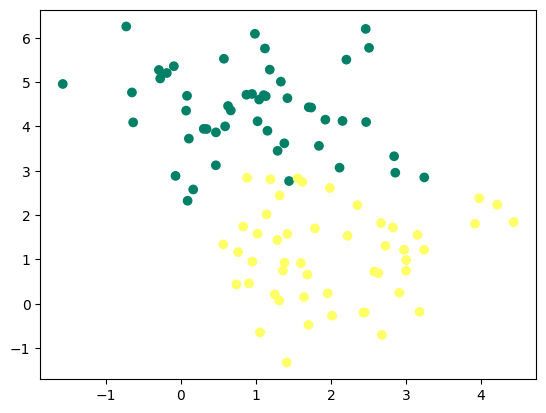

In [37]:
plt.scatter(X[:,0], X[:,1], c= y, cmap='summer')

In [38]:
class ArtificialNeuron:
    def __init__(self, learning_rate=0.1, n_iter=100):
        self.learning_rate = learning_rate
        self.n_iter = n_iter
        self.W = None
        self.b = None
        self.loss_history = []
        self.weights_history = []

    def fit(self, X, y):
        self._initialisation(X)
        self.loss_history = []
        self.weights_history = []
        for _ in range(self.n_iter):
            A = self._model(X)
            self.loss_history.append(self._log_loss(A, y))
            dW, db = self._gradients(A, X, y)
            self._update(dW, db)
            self.weights_history.append((self.W.copy(), self.b.copy()))
        plt.plot(self.loss_history)
        plt.xlabel("Iterations")
        plt.ylabel("Log Loss")
        plt.title("Loss curve")
        plt.show()
        return self

    def predict(self, X):
        return (self._model(X) >= 0.5).astype(int)

    def _initialisation(self, X):
        self.W = np.random.randn(X.shape[1], 1)
        self.b = np.random.randn(1)

    def _model(self, X):
        Z = X.dot(self.W) + self.b
        return 1 / (1 + np.exp(-Z))

    def _log_loss(self, A, y):
        return -1 / len(y) * np.sum(y * np.log(A) + (1 - y) * np.log(1 - A))

    def _gradients(self, A, X, y):
        dW = 1 / len(y) * np.dot(X.T, A - y)
        db = 1 / len(y) * np.sum(A - y)
        return dW, db

    def _update(self, dW, db):
        self.W -= self.learning_rate * dW
        self.b -= self.learning_rate * db

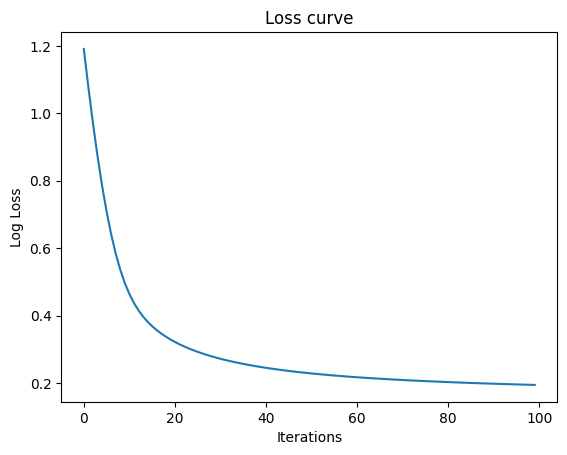

In [39]:
neuron = ArtificialNeuron(learning_rate=0.1, n_iter=100)
neuron.fit(X, y)

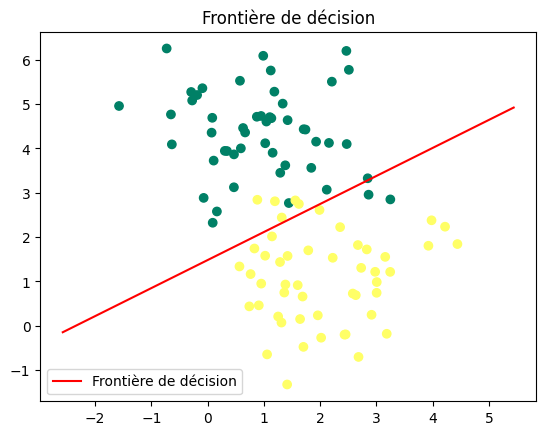

In [40]:
plt.figure()
x1 = np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 100)
x2 = -(neuron.W[0] * x1 + neuron.b) / neuron.W[1]

plt.scatter(X[:, 0], X[:, 1], c=y.ravel(), cmap='summer')
plt.plot(x1, x2, color='red', label='Frontière de décision')
plt.legend()
plt.title("Frontière de décision")
plt.show()

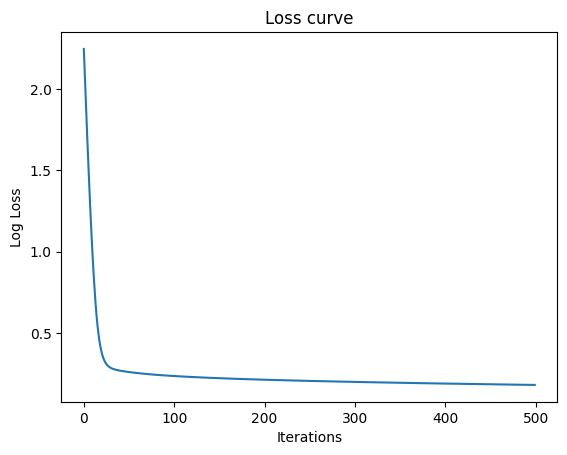

In [41]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

neuron_anim = ArtificialNeuron(learning_rate=0.1, n_iter=500)
neuron_anim.fit(X, y)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.patch.set_facecolor('#1c1c1c')
for ax in axes:
    ax.set_facecolor('#1c1c1c')
    ax.tick_params(colors='white')
    for spine in ax.spines.values():
        spine.set_edgecolor('#444')


ax0 = axes[0]
ax0.scatter(X[:, 0], X[:, 1], c=y.ravel(), cmap='summer', zorder=2)
x1_range = np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 100)
line_boundary, = ax0.plot([], [], color='orange', linewidth=2)
ax0.set_xlim(X[:, 0].min() - 1, X[:, 0].max() + 1)
ax0.set_ylim(X[:, 1].min() - 1, X[:, 1].max() + 1)
ax0.set_title('Frontiere de Décision', color='white')
ax0.set_xlabel('x1', color='white')


ax1 = axes[1]
z_range = np.linspace(-6, 6, 300)
ax1.plot(z_range, 1 / (1 + np.exp(-z_range)), color='orange', linewidth=2, zorder=3)
ax1.set_xlim(-6, 6)
ax1.set_ylim(-0.05, 1.05)
ax1.set_title('Sigmoid', color='white')
ax1.set_xlabel('z', color='white')
ax1.set_ylabel('A(z)', color='white')


colors_sigmoid = plt.cm.summer(y.ravel())
W0, b0 = neuron_anim.weights_history[0]
Z0 = (X.dot(W0) + b0).ravel()
A0 = (1 / (1 + np.exp(-Z0))).ravel()
scatter_sig = ax1.scatter(Z0, A0, c=colors_sigmoid, zorder=4)

n_samples = X.shape[0]
vlines = [ax1.plot([Z0[k], Z0[k]], [0, A0[k]], color='darkred', linewidth=0.7, alpha=0.8)[0]
          for k in range(n_samples)]


ax2 = axes[2]
loss_line, = ax2.plot([], [], color='red', linewidth=2)
ax2.set_xlim(0, neuron_anim.n_iter)
ax2.set_ylim(0, max(neuron_anim.loss_history) * 1.05)
ax2.set_title('Fonction Cout', color='white')
ax2.set_xlabel('iteration', color='white')
ax2.set_ylabel('Loss', color='white')

plt.tight_layout()

n_frames = 100
step = max(1, len(neuron_anim.weights_history) // n_frames)
frames = list(range(0, len(neuron_anim.weights_history), step))

def update(i):
    W, b = neuron_anim.weights_history[i]

    
    x2 = -(W[0] * x1_range + b) / W[1]
    line_boundary.set_data(x1_range, x2)

   
    Z = (X.dot(W) + b).ravel()
    A = (1 / (1 + np.exp(-Z))).ravel()
    scatter_sig.set_offsets(np.c_[Z, A])
    for k, vl in enumerate(vlines):
        vl.set_data([Z[k], Z[k]], [0, A[k]])

    
    loss_line.set_data(range(i + 1), neuron_anim.loss_history[:i + 1])

    return [line_boundary, scatter_sig, loss_line] + vlines

anim = FuncAnimation(fig, update, frames=frames, interval=60, blit=True)
plt.close()
HTML(anim.to_jshtml())


In [42]:
#!pip install h5py

In [43]:
from utilities import *

In [44]:
X_train, y_train, X_test, y_test = load_data()

In [45]:
X_train_reshape = X_train.reshape(X_train.shape[0], -1) / X_train.max()
X_train_reshape.shape

(1000, 4096)

In [46]:
X_test_reshape = X_test.reshape(X_test.shape[0], -1) / X_train.max()
X_test_reshape.shape

(200, 4096)

In [47]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_reshape)
X_test_scaled = scaler.transform(X_test_reshape)

In [48]:
class ArtificialNeuron_Cat_Dog:
    def __init__(self, learning_rate=0.01, n_iter=10000):
        self.learning_rate = learning_rate
        self.n_iter = n_iter
        self.W = None
        self.b = None
        self.loss_history = []
        self.weights_history = []
        self.accuracy_score = []

    def fit(self, X, y):
        self._initialisation(X)
        self.loss_history = []
        self.weights_history = []
        for i in range(self.n_iter):
            A = self._model(X)
            if i % 10 == 0:
                self.loss_history.append(self._log_loss(A, y))
                y_pred = self.predict(X)
                self.accuracy_score.append((y_pred == y).mean())

            dW, db = self._gradients(A, X, y)
            self._update(dW, db)

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(self.loss_history, label='train loss')
        plt.legend()
        plt.subplot(1, 2, 2)
        plt.plot(self.accuracy_score, label='train acc')
        plt.legend()
        plt.show()

        return self

    def predict(self, X):
        return (self._model(X) >= 0.5).astype(int)

    def _initialisation(self, X):
        self.W = np.random.randn(X.shape[1], 1)
        self.b = np.random.randn(1)

    def _model(self, X):
        Z = X.dot(self.W) + self.b
        return 1 / (1 + np.exp(-Z))

    def _log_loss(self, A, y):
        epsilon = 1e-15
        return -1 / len(y) * np.sum(y * np.log(A + epsilon) + (1 - y) * np.log(1 - A + epsilon))

    def _gradients(self, A, X, y):
        dW = 1 / len(y) * np.dot(X.T, A - y)
        db = 1 / len(y) * np.sum(A - y)
        return dW, db

    def _update(self, dW, db):
        self.W -= self.learning_rate * dW
        self.b -= self.learning_rate * db



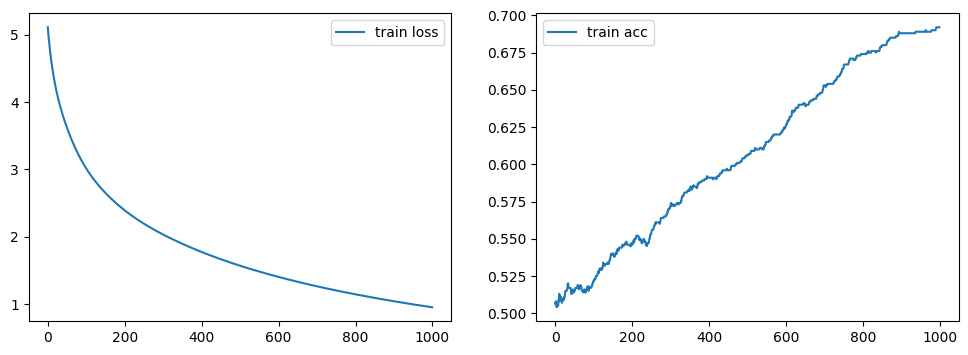

In [49]:
neuron = ArtificialNeuron_Cat_Dog()
neuron.fit(X_train_scaled, y_train)


In [59]:
class ArtificialNeuronV2(ArtificialNeuron):
    def fit(self, X, y, X_test=None, y_test=None):
        self._initialisation(X)
        self.loss_history = []
        self.test_loss_history = []
        self.train_acc_history = []
        self.test_acc_history = []
        self.weights_history = []

        for _ in tqdm(range(self.n_iter)):
            A = self._model(X)
            self.loss_history.append(self._log_loss(A, y))
            self.train_acc_history.append((self.predict(X) == y).mean())
            if X_test is not None and y_test is not None:
                A_test = self._model(X_test)
                self.test_loss_history.append(self._log_loss(A_test, y_test))
                self.test_acc_history.append((self.predict(X_test) == y_test).mean())
            dW, db = self._gradients(A, X, y)
            self._update(dW, db)
            self.weights_history.append((self.W.copy(), self.b.copy()))

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

        ax1.plot(self.loss_history, label='Train')
        if self.test_loss_history:
            ax1.plot(self.test_loss_history, label='Test')
        ax1.set_xlabel("Iterations")
        ax1.set_ylabel("Log Loss")
        ax1.set_title("Log Loss Curve")
        ax1.legend()

        ax2.plot(self.train_acc_history, label='Train')
        if self.test_acc_history:
            ax2.plot(self.test_acc_history, label='Test')
        ax2.set_xlabel("Iterations")
        ax2.set_ylabel("Accuracy")
        ax2.set_title("Accuracy Curve")
        ax2.legend()

        plt.tight_layout()
        plt.show()
        return self


  0%|          | 0/10000 [00:00<?, ?it/s]/var/folders/gg/dm5j6jg565j0bblwgpt9ggsw0000gn/T/ipykernel_5311/1235238387.py:39: RuntimeWarning: divide by zero encountered in log
  return -1 / len(y) * np.sum(y * np.log(A) + (1 - y) * np.log(1 - A))
/var/folders/gg/dm5j6jg565j0bblwgpt9ggsw0000gn/T/ipykernel_5311/1235238387.py:39: RuntimeWarning: invalid value encountered in multiply
  return -1 / len(y) * np.sum(y * np.log(A) + (1 - y) * np.log(1 - A))
100%|██████████| 10000/10000 [00:38<00:00, 258.89it/s]


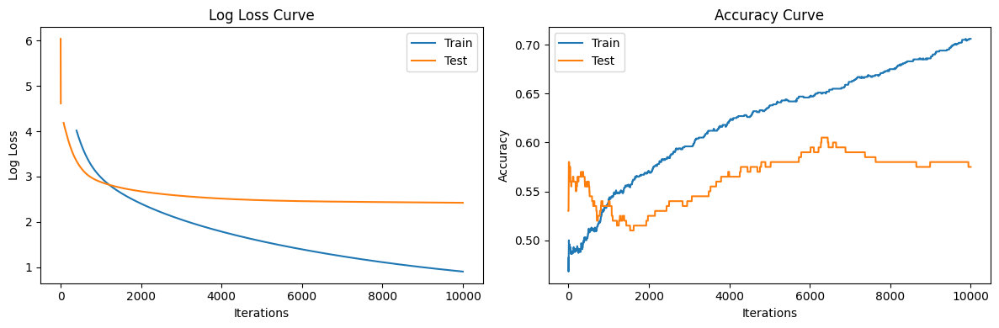

In [60]:
neuron_v2 = ArtificialNeuronV2(learning_rate=0.01, n_iter=10000)
neuron_v2.fit(X_train_scaled, y_train, X_test_scaled, y_test)